In [1]:
import tensorflow as tf
import numpy as np
import os
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dropout, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt


# set global random seed
seed_value = 42

os.environ['PYTHONHASHSEED'] = str(seed_value)
import random
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [2]:
# Check if TensorFlow is using the Metal plugin (I'm using a Macbook Air with a built in 16-core Neural Engin, want to make sure I'm using that to ensure faster runtime)
print("TensorFlow is using Metal:", tf.config.list_physical_devices('GPU'))

TensorFlow is using Metal: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Data Preprocessing

In [3]:
# ---- Global Variables and Methods----
IMAGE_FOLDER = "images/"
SAL_MAP_FOLDER = "saliency_maps/"
CSV_FILE = 'image_types.csv'
IMG_SIZE = (224, 224, 3)

In [14]:
# ---- Data Generator ----
class DataGenerator(tf.keras.utils.Sequence):
    '''
    A custom data loader for the UI images and saliency maps, inheriting from tf.keras.utils.Sequence.
    For instance, can be used with the following methods:
        model.fit(train_data_gen, validation_data=val_data_gen, ...)
        predictions = model.predict(data_gen)
        loss, mae = model.evaluate(data_gen)
    '''
    def __init__(self, image_folder, sal_map_folder, filenames, batch_size=1, shuffle=True, sample_size=None, augmentation=None):
        '''
        Constructor:
            image_folder (str): Path to the folder containing input images.
            sal_map_folder (str): Path to the folder containing saliency maps.
            filenames (list): List of filenames to include in this generator.
            batch_size (int): Number of samples per batch.
            shuffle (bool): Whether to shuffle the data at the end of each epoch.
            sample_size (int): Number of samples to use (for debugging).
        '''
        self.image_folder = image_folder # string, path to the folder containing input images
        self.sal_map_folder = sal_map_folder # string, path to the folder containing saliency maps
        self.batch_size = batch_size # int, number of samples per batch
        self.filenames = filenames # list of filenames (shared between the input images and their corresponding saliency maps) to convert to data
        self.sample_size = sample_size
        self.shuffle = shuffle # boolean, if using random shuffle each epoch
        self.augmentation = augmentation # specified data augmentation

        # Limit the dataset to a (smaller) sample_size if specified
        if self.sample_size and self.sample_size<len(self.filenames):
            self.filenames = self.filenames[:self.sample_size]

        self.on_epoch_end() # random shuffle

    def on_epoch_end(self): # if using random shuffle each epoch
        '''If shuffle=True, shuffles the list of filenames to randomize the order of data for the next epoch (automatically called by Keras)'''
        if self.shuffle:
            np.random.shuffle(self.filenames)

    def __len__(self):
        '''Returns the number of batches per epoch'''
        return int(np.floor(len(self.filenames) / self.batch_size))

    def __getitem__(self, index):
        '''
        Generates one batch of data given the index of the batch (automatically called by Keras)
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        
        Can be called using the [] indexing operator
        '''
        # select a subset of filenames for the current batch
        batch_files = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        # load and preprocess the images and saliency maps for the specified batch
        return self.__data_generation(batch_files)
    
    def __data_generation(self, batch_files):
        '''
        Load and preprocess the images and saliency maps.
        Returns tuple (X, Y), both normalized to [0,1]
        X: batch of input images of shape (batch_size, height, width, channels)
        Y: batch of corresponding saliency maps of shape (batch_size, height, width, 1)
        '''
        X, Y = [], []
        for file in batch_files:
            # UI image
            img_path = os.path.join(self.image_folder, file)
            img = load_img(img_path, target_size=IMG_SIZE[:2]) # load and resize image to IMG_SIZE
            img = img_to_array(img) / 255.0 # convert images to arrays and normalize them to [0,1]
            
            # corresponding saliency map (grayscale)
            sal_path = os.path.join(self.sal_map_folder, file)
            sal_img = load_img(sal_path, target_size=IMG_SIZE[:2], color_mode="grayscale") # load and resize image to IMG_SIZE
            sal_img = img_to_array(sal_img) / 255.0 # convert images to arrays and normalize them to [0,1]

            # data augmentation
            if self.augmentation=='flip_horizontal':
                img = np.fliplr(img)
                sal_img = np.fliplr(sal_img)
            
            elif self.augmentation=='flip_vertical':
                img = np.flipud(img)
                sal_img = np.flipud(sal_img)

            elif self.augmentation=='rotate_90':
                img = np.rot90(img)
                sal_img = np.rot90(sal_img)
            

            X.append(img)
            Y.append(sal_img)

        return np.array(X), np.array(Y) # convert from list to np.arrays
    
    def saliency_binary_proportion(self):
        '''
        Calculates the average proportion of pixel values > 0.5
        in the target saliency maps (Y) across all batches in the generator.
        '''
        proportion = 0.0
        n_batches = len(self)
        N = IMG_SIZE[0]*IMG_SIZE[1] # image size, total number of pixels per map

        for i in range(n_batches):
            # Get the current batch of data
            _, Y = self[i]
            
            # Calculate the number of pixels > 0.5 in the saliency maps (Y)
            pixels_gt_0_5 = np.sum(Y > 0.5)

            # The total number of pixels in the saliency maps (Y)
            total_pixels = self.batch_size*N
            
            # Accumulate the proportion of salient pixels
            proportion += (pixels_gt_0_5 / total_pixels)

        # Calculate the average proportion across all batches
        return proportion / n_batches

In [56]:
# ---- Handle Missing Data ----
# Load the CSV file into a DataFrame
df = pd.read_csv(CSV_FILE, sep=',')

# Get the list of filenames from the CSV file, the image folder, and the saliency map folder
csv_filenames = set(df["Image Name"])
image_filenames = set(os.listdir(IMAGE_FOLDER))
sal_map_filenames = set(os.listdir(SAL_MAP_FOLDER))

print(f"There are {len(csv_filenames)} filenames in the CSV file.")
print(f"There are {len(image_filenames)} filenames in the Image folder.")
print(f"There are {len(sal_map_filenames)} filenames in the Saliency Map folder.")


# Find filenames that are missing in any of the three locations
missing_files = (csv_filenames | image_filenames | sal_map_filenames) - (csv_filenames & image_filenames & sal_map_filenames)

# Print missing filenames
if missing_files:
    print("The following filenames are missing in one or more locations:")
    for filename in missing_files:
        print(filename)
else:
    print("All filenames are present in all three locations.")

# Remove missing filenames from the CSV file
df = df[~df['Image Name'].isin(missing_files)]

print(f"Removed {len(missing_files)} filenames from the CSV file.\n")
print(f'Remaining Number of Data Samples:{df.shape[0]}')
print(f'Remaining Number of Desktop Samples:{df[df["Category"] == "desktop"].shape[0]}')
print(f'Remaining Number of Mobile Samples:{df[df["Category"] == "mobile"].shape[0]}')
print(f'Remaining Number of Web Samples:{df[df["Category"] == "web"].shape[0]}')
print(f'Remaining Number of Poster Samples:{df[df["Category"] == "poster"].shape[0]}')

There are 1463 filenames in the CSV file.
There are 1483 filenames in the Image folder.
There are 1924 filenames in the Saliency Map folder.
The following filenames are missing in one or more locations:
d9508a.png
a53761.png
520b4a.png
e2af38.png
f9e25e.png
f9fed0.png
38ad0c.png
7d1335.png
576a9f.jpg
49e72e.png
d95bad.png
51f811.png
ead495.png
bf97aa.png
599a18.jpg
6dacc6.jpg
4d78ff.png
e5635e.jpg
7db957.jpg
fdba74.png
a44696.png
ad1260.jpg
f29bd9.jpg
ceb6b3.png
cdcaf8.jpg
daaa3f.png
48a5a0.png
511db2.png
c78cef.jpg
5bcc14.jpg
bf05c8.png
7cc04a.png
48582c.png
fb8701.png
e663f9.png
c0e167.png
5cfc08.png
eadf4b.jpg
c53dc2.png
90181f.jpg
536e7f.jpg
ff561b.png
f14f17.jpg
529ce0.png
aac976.png
c05cd5.jpg
7cd2e0.jpg
4e729d.png
e7163d.png
4cdee3.png
50ebe2.png
e864da.png
d5493d.png
da1d78.png
d4988b.jpg
cc25e1.png
46bc27.jpg
c7db2d.png
e277d3.jpg
33d2a6.png
35aa58.png
7d61f6.jpg
7d53b3.png
66935b.jpg
e1f7b0.jpg
db12fc.png
4e3225.jpg
57879f.png
66058d.png
7decae.jpg
ab7961.jpg
aac709.jpg
a0575

In [57]:
# ---- Initialize DataLoaders ----

# test data for evaluating generalization
test_files_poster = df[(df['Train/Test'] == 'Test') & (df['Category'] == "poster")]['Image Name'].tolist() # testing filenames
test_files_mobile = df[(df['Train/Test'] == 'Test') & (df['Category'] == "mobile")]['Image Name'].tolist() # testing filenames
test_files_web = df[(df['Train/Test'] == 'Test') & (df['Category'] == "web")]['Image Name'].tolist() # testing filenames

# Filter by category if needed (desktop, poster, mobile, web) !!!
df = df[df['Category'] == "desktop"]

# Split the training data by randomly selecting valid_size*100% of the training data for validation
train_files = df[df['Train/Test'] == 'Train']['Image Name'].tolist()
valid_size = 0.2 # Split ratio
valid_indices = np.random.choice(len(train_files), int(len(train_files) * valid_size), replace=False)

# Get the list of...
valid_files = [train_files[i] for i in valid_indices] # validation filenames
train_files = [train_files[i] for i in range(len(train_files)) if i not in valid_indices] # training filenames
test_files_desktop = df[df['Train/Test'] == 'Test']['Image Name'].tolist() # testing filenames

# Check the number of samples in each generator
print("Number of training samples:", len(train_files))
print("Number of validation samples:", len(valid_files))
print("Number of test (desktop) samples:", len(test_files_desktop))
print("Number of test (mobile) samples:", len(test_files_mobile))
print("Number of test (poster) samples:", len(test_files_poster))
print("Number of test (web) samples:", len(test_files_web))

# Initialize the training, validation, testing DataGenerators (no need to shuffle validation or testdata)
train_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, train_files, batch_size = 16)
valid_data_gen = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, valid_files, shuffle=False, batch_size = 16)
test_data_gen_desktop = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16)

# Initialize the testing DataGenerators for evaluating generalizability
test_data_gen_mobile = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_mobile, shuffle=False, batch_size = 16)
test_data_gen_poster = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_poster, shuffle=False, batch_size = 16)
test_data_gen_web = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_web, shuffle=False, batch_size = 16)
test_data_gen_rotated_90 = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='rotate_90')
test_data_gen_flip_horizontal = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='flip_horizontal')
test_data_gen_flip_vertical = DataGenerator(IMAGE_FOLDER, SAL_MAP_FOLDER, test_files_desktop, shuffle=False, batch_size = 16, augmentation='flip_vertical')

# Check the number of batches in each generator
print("Number of training batches:", len(train_data_gen))
print("Number of validation batches:", len(valid_data_gen))
print("Number of test (desktop) batches:", len(test_data_gen_desktop))
print("Number of test (mobile) batches:", len(test_data_gen_mobile))
print("Number of test (poster) batches:", len(test_data_gen_poster))
print("Number of test (web) batches:", len(test_data_gen_web))

# View the first batch of training data
batch1 = train_data_gen[0]
print("Training input batch shape:", batch1[0].shape)
print("Training saliency batch shape:", batch1[1].shape)

Number of training samples: 276
Number of validation samples: 69
Number of test (desktop) samples: 18
Number of test (mobile) samples: 17
Number of test (poster) samples: 17
Number of test (web) samples: 22
Number of training batches: 17
Number of validation batches: 4
Number of test (desktop) batches: 1
Number of test (mobile) batches: 1
Number of test (poster) batches: 1
Number of test (web) batches: 1
Training input batch shape: (16, 224, 224, 3)
Training saliency batch shape: (16, 224, 224, 1)


In [12]:
# Function to visualize the original image, ground truth saliency map, and predicted saliency map
def visualize_data_gen(data_gen, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[i])  # Only use the first sample in the batch
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[i].squeeze(), cmap='gray')  # Only use the first sample in the batch
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

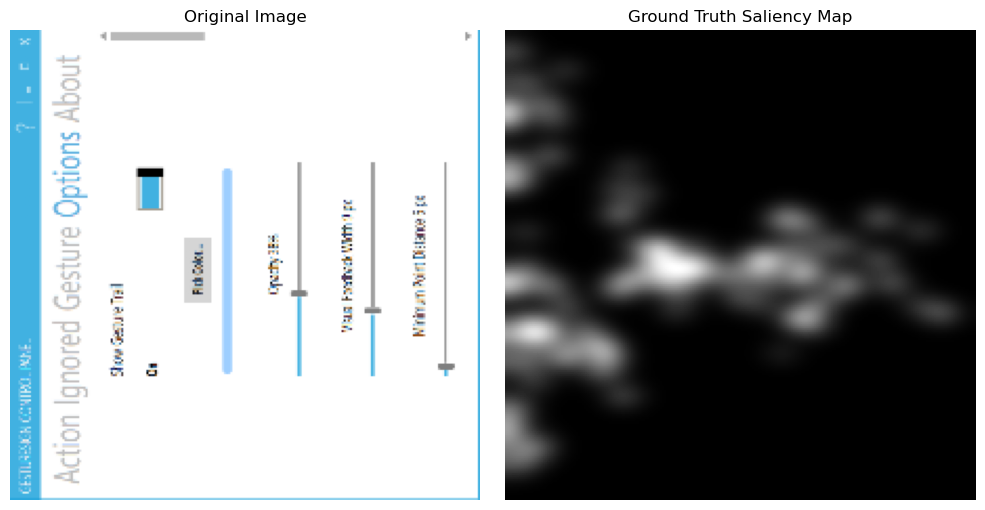

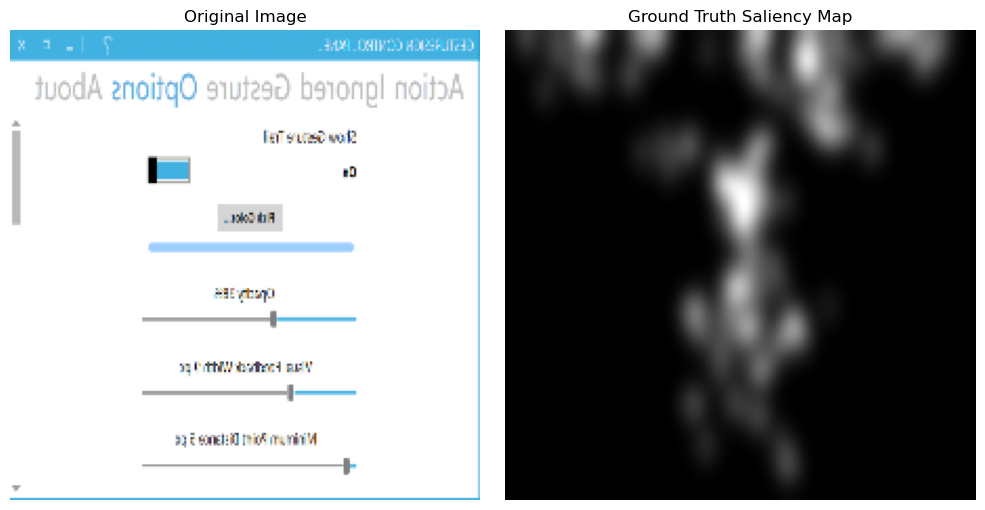

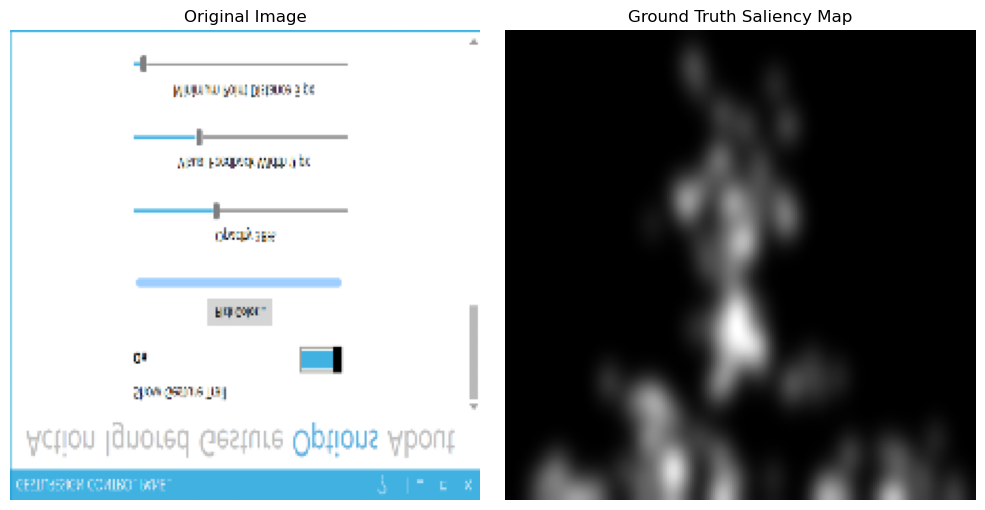

In [ ]:
# verify data augmentation implementations
visualize_data_gen(test_data_gen_rotated_90, num_samples=1)
visualize_data_gen(test_data_gen_flip_horizontal, num_samples=1)
visualize_data_gen(test_data_gen_flip_vertical, num_samples=1)

# Defining Methods for Evaluating the Model Training Process and Performance

In [126]:
# Plot the learning curve according to loss function
def plot_learning_curve(history):
    # Extract loss and metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    
    # Plot the loss curve
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
        
    plt.tight_layout()
    plt.show()


def plot_learning_curve_loss(history):
    # Extract loss and metrics from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    
    # Plot the loss curve
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
        
    plt.tight_layout()
    plt.show()


def plot_all_learning_curves(history_obj):

    # Create a 2x4 grid of subplots
    fig, axes = plt.subplots(2, 4, figsize=(5*2, 5*4))
    fig.suptitle('Training and Validation Performance', fontsize=16)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    # Plot each metric in a subplot
    train_metric = history_obj.history['auc_judd']
    val_metric = history_obj.history['val_auc_judd']
    epochs = range(1, len(train_metric) + 1) # number of epochs
    axes[0].plot(epochs, train_metric, 'bo-', label='Training')
    axes[0].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('AUC-Judd')
    axes[0].legend()
    
    train_metric = history_obj.history['auc_PR']
    val_metric = history_obj.history['val_auc_PR']
    axes[1].plot(epochs, train_metric, 'bo-', label='Training')
    axes[1].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('AUC-PR')
    axes[1].legend()

    train_metric = history_obj.history['nss']
    val_metric = history_obj.history['val_nss']
    axes[2].plot(epochs, train_metric, 'bo-', label='Training')
    axes[2].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[2].set_xlabel('Epochs')
    axes[2].set_ylabel('NSS')
    axes[2].legend()

    train_metric = history_obj.history['information_gain']
    val_metric = history_obj.history['val_information_gain']
    axes[3].plot(epochs, train_metric, 'bo-', label='Training')
    axes[3].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[3].set_xlabel('Epochs')
    axes[3].set_ylabel('Information Gain')
    axes[3].legend()

    train_metric = history_obj.history['similarity']
    val_metric = history_obj.history['val_similarity']
    axes[4].plot(epochs, train_metric, 'bo-', label='Training')
    axes[4].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[4].set_xlabel('Epochs')
    axes[4].set_ylabel('Similarity')
    axes[4].legend()

    train_metric = history_obj.history['similarity_opposite']
    val_metric = history_obj.history['val_similarity_opposite']
    axes[5].plot(epochs, train_metric, 'bo-', label='Training')
    axes[5].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[5].set_xlabel('Epochs')
    axes[5].set_ylabel('Similarity (Opposite)')
    axes[5].legend()

    train_metric = history_obj.history['correlation_coefficient']
    val_metric = history_obj.history['val_correlation_coefficient']
    axes[6].plot(epochs, train_metric, 'bo-', label='Training')
    axes[6].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[6].set_xlabel('Epochs')
    axes[6].set_ylabel('Correlation Coefficient')
    axes[6].legend()

    train_metric = history_obj.history['kl_divergence']
    val_metric = history_obj.history['val_kl_divergence']
    axes[7].plot(epochs, train_metric, 'bo-', label='Training')
    axes[7].plot(epochs, val_metric, 'ro-', label='Validation')
    axes[7].set_xlabel('Epochs')
    axes[7].set_ylabel('KL Divergence')
    axes[7].legend()

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

#------------------------------------------------- following functions are getting errors

def plot_all_learning_curves_not_working(history_obj):
    #TODO: 'History' object is not scriptable error
    # Define the metrics to plot
    metrics_to_plot = ['auc_judd', 'auc_PR', 'nss', 'information_gain', 'similarity', 'similarity_opposite', 'correlation_coefficient', 'kl_divergence']

    # Create a 2x4 grid of subplots (adjust rows and columns as needed)
    num_metrics = int(len(metrics_to_plot)/2)
    num_rows = 2
    num_cols = (num_metrics + 1) // 2  # Ensure enough columns
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))
    fig.suptitle('Training and Validation Performance', fontsize=16)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    # Plot each metric in a subplot
    for i, metric in enumerate(metrics_to_plot):
        
        # Extract loss and metrics from the history object
        train_metric = history_obj.history[f'{metric}']
        val_metric = history_obj.history[f'val_{metric}']
        epochs = range(1, len(train_metric) + 1)

        ax = axes[i]
        ax.plot(epochs, train_metric, 'bo-', label=f'Training {metric}')
        ax.plot(epochs, val_metric, 'ro-', label=f'Validation {metric}')
        ax.set_title(metric.upper())
        ax.set_xlabel('Epochs')
        ax.set_ylabel(metric)
        ax.legend()

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [45]:
# Function to visualize the original image, ground truth saliency map, and predicted saliency map
def visualize_results(model, data_gen, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency map
        Y_pred = model.predict(X, verbose=0)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(Y_pred[i].squeeze(), cmap='gray')
        plt.title("Predicted Saliency Map")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Function to visualize the original image, ground truth saliency map, and predicted saliency map
def compare_visualized_results(model_old, model_new, data_gen, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))
    
    for i in range(num_samples):
        # Get a new batch for each sample
        X, Y_sal = data_gen[i % len(data_gen)]  # Cycle through batches if num_samples > batch_size
        
        # Predict saliency maps
        Y_pred_old = model_old.predict(X, verbose=0)
        Y_pred_new = model_new.predict(X, verbose=0)
        
        # Original Image (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X[i])
        plt.title("Original Image")
        plt.axis('off')
        
        # Ground Truth Saliency Map (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(Y_sal[i].squeeze(), cmap='gray')
        plt.title("Ground Truth Saliency Map")
        plt.axis('off')
        
        # Predicted Saliency Map by Model 1 (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(Y_pred_old[i].squeeze(), cmap='gray')
        plt.title(f"Predicted Saliency Map by Old Model")
        plt.axis('off')

        # Predicted Saliency Map by Model 2 (already resized to IMG_SIZE in DataGenerator)
        plt.subplot(num_samples, 3, i * 3 + 4)
        plt.imshow(Y_pred_new[i].squeeze(), cmap='gray')
        plt.title(f"Predicted Saliency Map by New Model")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Defining the Loss Terms and Model Evaluation Metrics

### Define various normalization and scaling functions

In [46]:
# ----------------------------- Scaling Functions ----------------------------- 

def batch_min_max_scaling(heatmap):
    '''
    Min-Max scaling
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))
    
    return heatmap

def min_max_scaling(heatmap):
    '''
    Min-Max scaling
    '''
    # Compute min and max for each sample in the batch
    min_vals = K.min(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)
    max_vals = K.max(heatmap, axis=[1, 2], keepdims=True)  # Shape: (batch_size, 1, 1, 1)

    # Apply min-max scaling to each sample
    heatmap = (heatmap - min_vals) / (K.epsilon() + max_vals - min_vals)

    return heatmap

def max_scaling(heatmap):
    '''
    Max scaling
    This method is adapted from 'sal_imp_utilities.py' written by the UEyes team.
    '''

    max_heatmap = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(heatmap, axis=[1,2]), axis=2),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    heatmap /= (max_heatmap + K.epsilon())
    
    return heatmap




# ----------------------------- Normalization Functions ----------------------------- 

def batch_sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across the tensor (batch).
    '''
    heatmap /= (K.epsilon() + K.sum(heatmap))

    return heatmap

def sum_normalize(heatmap):
    '''
    Sum Normalize heatmap values in the [0,1] range across each map in the tensor (batch).
    '''

    heatmap /= (K.epsilon() + K.sum(heatmap, axis=[1, 2], keepdims=True))

    return heatmap

def mean_std_normalize(heatmap):
    '''
    Zero mean and unit variance normalization across each map in the tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team
    '''

    # Convert input to TensorFlow tensor if it's a NumPy array
    if isinstance(heatmap, np.ndarray):
        heatmap = tf.convert_to_tensor(heatmap)

    # Flatten spatial dimensions (height * width)
    heatmap_flat = K.batch_flatten(heatmap)  # Shape: (batch_size, height * width)

    # Compute mean and std across all spatial positions
    heatmap_mean = K.mean(heatmap_flat, axis=-1, keepdims=True)  # Shape: (batch_size, 1)
    heatmap_std = K.std(heatmap_flat, axis=-1, keepdims=True)    # Shape: (batch_size, 1)

    # Reshape mean and std for broadcasting back to original shape
    heatmap_mean = K.reshape(heatmap_mean, (-1, 1, 1, 1))  # (batch_size, 1, 1, 1)
    heatmap_std = K.reshape(heatmap_std, (-1, 1, 1, 1))    # (batch_size, 1, 1, 1)

    # Normalize the heatmap
    return (heatmap - heatmap_mean) / (heatmap_std + K.epsilon())

### Define various loss functions

In [ ]:
# ------------------------------------ Losses used by UEyes Team ------------------------------------

mse = tf.keras.losses.MeanSquaredError()


def nss_(y_true, y_pred, scaler=False):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    ax = 1

    if K.all(K.equal(K.sum(K.sum(y_true, axis=ax), axis=ax), 0.0)):
        return 0.0

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=ax), axis=ax), axis=ax+1), IMG_SIZE[0], axis=ax), axis=ax+1), IMG_SIZE[1], axis=ax+1)

    y_pred /= (max_y_pred + K.epsilon())

    y_pred_flatten = K.batch_flatten(y_pred)

    y_mean = K.mean(y_pred_flatten, axis=-1)
    y_mean = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_mean)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_std = K.std(y_pred_flatten, axis=-1)
    y_std = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.expand_dims(y_std)), IMG_SIZE[0], axis=ax)), IMG_SIZE[1], axis=ax+1)

    y_pred = (y_pred - y_mean) / (y_std + K.epsilon())

    den = K.sum(K.sum(y_true * y_pred, axis=ax), axis=ax)
    nom = K.sum(K.sum(y_true, axis=ax), axis=ax) + K.epsilon()

    nss_out = den/nom
    if scaler:
        nss_out = K.mean(nss_out)

    return  nss_out

def nss(y_true, y_pred, scaler=False):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    if K.all(K.equal(K.sum(y_true, axis=[1,2]), 0.0)):
        return tf.convert_to_tensor(0.0) # 0.0

    y_pred = max_scaling(y_pred) # why use max-scaling at all before normalization???
    y_pred = mean_std_normalize(y_pred)

    den = K.sum(y_true * y_pred, axis=[1,2])
    nom = K.sum(y_true, axis=[1,2]) + K.epsilon()

    nss_out = den/nom

    if scaler:
        nss_out = K.mean(nss_out)

    return  nss_out

def nss_loss(y_true, y_pred):
    """
    Compute Normalized Scanpath Saliency (NSS) score.
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    return  -nss(y_true, y_pred)


def correlation_coefficient_(y_true, y_pred, scaler=False):
    """
    Compute Cross-Correlation (CC) score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    """
    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= (max_y_pred + K.epsilon())

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(K.sum(y_true * y_pred, axis=1), axis=1)
    sum_x = K.sum(K.sum(y_true, axis=1), axis=1)
    sum_y = K.sum(K.sum(y_pred, axis=1), axis=1)
    sum_x_square = K.sum(K.sum(K.square(y_true), axis=1), axis=1)
    sum_y_square = K.sum(K.sum(K.square(y_pred), axis=1), axis=1)

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    if scaler: 
        return K.mean(num / den)
    else:
        return num / den


def correlation_coefficient(y_true, y_pred, scaler=False):
    """
    Compute Correlation Coefficient score, range is [0,1]
    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    """

    #y_pred = max_scaling(y_pred) # idk why use max-scaling at all before normalization, makes no difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    N = IMG_SIZE[0] * IMG_SIZE[1]
    sum_prod = K.sum(y_true * y_pred, axis=[1,2])
    sum_x = K.sum(y_true, axis=[1,2])
    sum_y = K.sum(y_pred, axis=[1,2])
    sum_x_square = K.sum(K.square(y_true), axis=[1,2])
    sum_y_square = K.sum(K.square(y_pred), axis=[1,2])

    num = sum_prod - ((sum_x * sum_y) / N)
    den = K.sqrt((sum_x_square - K.square(sum_x) / N) * (sum_y_square - K.square(sum_y) / N)) + K.epsilon()

    if scaler: 
        return K.mean(num / den) 
    else:
        return num / den

def correlation_coefficient_loss(y_true, y_pred):
    return -correlation_coefficient(y_true, y_pred)


def batch_min_max_sum_normalize(heatmap):
    '''
    Min-Max scaling
    Sum Normalize heatmap values in the [0,1] range across entire tensor (batch).
    This method is from 'sal_imp_utilities.py' written by the UEyes team, called 'normalize'.
    '''

    # Apply mimaxscaler algorithm (https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization))
    heatmap = (heatmap - K.min(heatmap)) / (K.epsilon() + K.max(heatmap) - K.min(heatmap))

    # Sum normalization
    heatmap /= (K.epsilon() + K.sum(heatmap))
    
    return heatmap

def similarity_(y_true, y_pred):
    '''
    Compute Similarity score.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    y_pred = batch_min_max_sum_normalize(y_pred)
    y_true = batch_min_max_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))


def similarity(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the normalized predicted map and ground-truth map. 
    The absence of saliency values points to zero similarity (sensitive to failed detection of saliency points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))

def similarity_loss(y_true, y_pred):
    return -similarity(y_true,y_pred)



kl = tf.keras.losses.KLDivergence() # Initialize the KL Divergence loss instance once
def kl_divergence(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss, range is [0,inf)
    Quantifies the difference between the distributions of the saliency map prediction and the ground truth (the smaller the better)

    This method is from 'losses_keras2.py' written by the UEyes team.
    '''
    #y_pred = max_scaling(y_pred) # used axis=1??? also idk why use max-scaling at all before normalization, makes no difference???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)
    
    return kl(y_true,y_pred) # scale up between the range in practice is very small


def kl_divergence_(y_true, y_pred):
    '''
    Compute Kullback-Leibler divergence loss.
    This method is from 'losses_keras2.py' written by the UEyes team.
    '''

    max_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.max(K.max(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_pred /= max_y_pred

    sum_y_true = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_true, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    sum_y_pred = K.repeat_elements(K.expand_dims(K.repeat_elements(K.expand_dims(K.sum(K.sum(y_pred, axis=1), axis=1), axis=1),
                                                                   IMG_SIZE[0], axis=1), axis=2), IMG_SIZE[1], axis=2)
    y_true /= (sum_y_true + K.epsilon())
    y_pred /= (sum_y_pred + K.epsilon())
    
    return kl(y_true,y_pred)


# ------------------------------------ New Losses to Consider ------------------------------------

mae = tf.keras.losses.MeanAbsoluteError()
"""
Compute the MAE between two (batches of) saliency maps y and y'.
"""


cs_ = tf.keras.metrics.CosineSimilarity(axis=[1,2])
def cosine_similarity(y_true, y_pred):
    """
    Compute the cosine similarity between two (batches of) saliency maps y and y'.
    """
    return cs_(y_true, y_pred)

cs_loss = tf.keras.losses.CosineSimilarity(axis=[1,2])
def cosine_similarity_loss(y_true, y_pred):
    return cs_loss(y_true, y_pred)


def similarity_opposite(y_true, y_pred):
    '''
    Compute Similarity score, range is [0,1]
    Intersection/overlap between the predicted and the ground-truth saliency maps
    the sum of the minimum value of the inverted normalized predicted map and ground-truth map. 
    The absence of non-salient values points to zero similarity (sensitive to failed detection of non-salient points)

    This method is adapted from 'losses_keras2.py' written by the UEyes team.
    '''

    # invert the maps
    y_pred = -y_pred+1
    y_true = -y_true+1

    # sum normalization across each map so that the similarity score is [0,1] per batch of maps
    y_pred = batch_sum_normalize(y_pred)
    y_true = batch_sum_normalize(y_true)

    return K.sum(K.minimum(y_pred, y_true))

def similarity_opposite_loss(y_true, y_pred):
    return -similarity_opposite(y_true,y_pred)

def entropy(y_true, y_pred):
    """
    TODO: binary focal cross entropy from keras
    """
    return

### Combine different loss functions to form loss terms

In [48]:
# ------------------------------------ Loss Combinations used by UEyes Team ------------------------------------

def combined_loss_UEyes(y_true, y_pred):
    '''
    Uses functions implemented by UEyes.

    Loss function that combines cc, nss and kl. Beacuse nss receives a different ground truth than kl and cc (maps),
        the function requires y_true to contains both maps. It has to be a tensor with dimensions [bs, 2, r, c, 1]. y_pred also
        has to be a tensor of the same dim, so the model should add a 5th dimension between bs and r and repeat the predict map
        twice along that dim.
    This method is adapted from the method in 'losses_keras2.py' written by the UEyes team.
    Returns a combined loss term with the specified weights that can be used in model.compile().
    '''

    # loss term weights specified by the UEyes team
    kl_weight=10.0
    cc_weight=3.0
    sim_weight=1.0
    nss_weight=0.5
    mse_weight=1

    # compute loss terms
    k = kl_divergence_(y_true, y_pred)
    c = correlation_coefficient_(y_true, y_pred) # cc becoming nan values after 8 passes???
    n = nss_(y_true, y_pred)
    s = similarity_(y_true, y_pred)
    m = mse(y_true, y_pred) # tf.reduce_mean(tf.square(y_true - y_pred))
    
    # combined loss
    return kl_weight*k - nss_weight*n - sim_weight*s - cc_weight*c  + mse_weight*m 


# ------------------------------------ New Loss Combinations to Consider ------------------------------------
def combined_loss(y_true, y_pred):
    '''
    Returns a combined loss term with the specified weights that can be used in model.compile().
    TODO: add the new loss terms to consider
    '''

    # loss term weights
    kl_weight=1.0
    cc_weight=1.0
    nss_weight=1.0
    cs_weight=0.5

    # compute loss terms
    k = kl_divergence(y_true, y_pred)
    c = correlation_coefficient_loss(y_true, y_pred)
    n = nss_loss(y_true, y_pred)
    cs = cosine_similarity_loss(y_true, y_pred)
    
    # combined loss
    return kl_weight*k + nss_weight*n + cc_weight*c + cs_weight*cs

### Define various evaluation metrics

In [49]:
# ------------------------------------ Metrics used by UEyes Team ------------------------------------

auc_ROC = tf.keras.metrics.AUC(num_thresholds=100) # Initialize the AUC metric instance once
def auc_judd(y_true, y_pred):
    """
    Compute AUC-Judd score (from the ROC curve).
    """
    y_true = K.batch_flatten(y_true)  # Flatten to (batch_size, height * width,)
    y_pred = K.batch_flatten(y_pred)  # Flatten to (batch_size, height * width,)

    auc_ROC.update_state(y_true, y_pred)
    return auc_ROC.result()


def information_gain(y_true, y_pred, baseline="uniform"):
    """
    Compute Information Gain (IG) score. 
    (TODO: check the definition bc UEyes didn't provide implementation)!!!

    Positive IG: Indicates that the predicted saliency map provides more information than the baseline.
    Zero IG: Indicates that the predicted saliency map provides the same amount of information as the baseline.
    Negative IG: Indicates that the predicted saliency map provides less information than the baseline.
    """

    # Define the baseline ???
    y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    if baseline == "uniform":
        # Uniform distribution (1/N)
        y_baseline = tf.ones_like(y_true) / (IMG_SIZE[0] * IMG_SIZE[1])
    elif baseline == "center":
        # Create a center bias map (Gaussian centered at the image center)
        x = tf.linspace(-1.0, 1.0, 224)
        y = tf.linspace(-1.0, 1.0, 224)
        x, y = tf.meshgrid(x, y)
        y_baseline = tf.exp(-(x**2 + y**2) / 0.1)  # Gaussian kernel
        y_baseline = y_baseline / (K.sum(y_baseline) + K.epsilon())  # Normalize
        y_baseline = tf.expand_dims(y_baseline, axis=-1)  # Add channel dimension
        y_baseline = tf.expand_dims(y_baseline, axis=0)  # Add batch dimension

    
    # Sum normalization (so that the saliency maps are normalized to sum to 1, i.e., are probability distributions) ???
    y_pred = sum_normalize(y_pred)
    y_true = sum_normalize(y_true)

    # Compute log-likelihood ratio
    log_ratio = K.log((y_pred + K.epsilon()) / (y_baseline + K.epsilon()))

    # Compute IG
    return K.mean(K.sum(y_true * log_ratio, axis=[1, 2]))


# ------------------------------------ New Metrics to Consider ------------------------------------

auc_PR_ = tf.keras.metrics.AUC(num_thresholds=100, curve='PR') # Initialize the AUC metric instance once
def auc_PR(y_true, y_pred):
    """
    Compute AUC score (from the precision-recall curve).
    """

    auc_PR_.update_state(y_true, y_pred)
    return auc_PR_.result()


In [50]:
combined_metrics=[auc_judd,  # AUC-Judd (of ROC curve)
                  auc_PR,  # AUC of PR curve
                  nss,       # Normalized Scanpath Saliency
                  information_gain,  # Information Gain
                  similarity,  # Similarity
                  similarity_opposite,  # Similarity
                  correlation_coefficient,  # Correlation Coefficient
                  kl_divergence]  # KL Divergence


pd.set_option('display.float_format', '{:.15f}'.format)
def train_test_performance(model, test_data_gen_):
    '''
    Display the model's performance on training data and test data across different metrics.
    '''
    # Compute performance on train data
    performance_train = {}
    for metric in model.metrics:
        result = metric.result()
        result = result.numpy().item()
        if isinstance(result, dict):
            performance_train.update(result)
        else:
            performance_train[metric.name] = result
    performance_train = pd.DataFrame(performance_train,index=['Train'])

    # Compute performance on test data
    performance_test = model.evaluate(test_data_gen_,return_dict=True, verbose=0)
    performance_test = pd.DataFrame(performance_test,index=['Test'])

    # Provide results in a table    
    return pd.concat([performance_train, performance_test])

### Define learning rate optimzer and early stopping for training

In [51]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True) # Restore model weights from the epoch with the best value of val_loss.
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.0001)
opt = Adam(learning_rate=0.001)

### Define the UMSI++ base model

In [52]:
# Define the UMSI++ model
def UMSI(input_shape=(224, 224, 3)):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # --------------------------
    # Encoder (Feature Extraction)
    # --------------------------
    # Block 1
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
    x1 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x1)
    p1 = MaxPooling2D((2, 2), name='block1_pool')(x1)
    
    # Block 2
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(p1)
    x2 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x2)
    p2 = MaxPooling2D((2, 2), name='block2_pool')(x2)
    
    # Block 3
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv1')(p2)
    x3 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block3_conv2')(x3)
    p3 = MaxPooling2D((2, 2), name='block3_pool')(x3)
    
    # --------------------------
    # Bottleneck (Multi-Scale Feature Aggregation)
    # --------------------------
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv1')(p3)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same', name='bottleneck_conv2')(bottleneck)
    
    # --------------------------
    # Decoder (Saliency Map Reconstruction)
    # --------------------------
    # Block 4
    u4 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', name='block4_deconv')(bottleneck)
    u4 = concatenate([u4, x3], name='block4_concat')
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(u4)
    u4 = Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(u4)
    
    # Block 5
    u5 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='block5_deconv')(u4)
    u5 = concatenate([u5, x2], name='block5_concat')
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv1')(u5)
    u5 = Conv2D(64, (3, 3), activation='relu', padding='same', name='block5_conv2')(u5)
    
    # Block 6
    u6 = Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same', name='block6_deconv')(u5)
    u6 = concatenate([u6, x1], name='block6_concat')
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv1')(u6)
    u6 = Conv2D(32, (3, 3), activation='relu', padding='same', name='block6_conv2')(u6)
    
    # --------------------------
    # Saliency Output
    # --------------------------
    saliency_output = Conv2D(1, (1, 1), activation='sigmoid', name='saliency_output')(u6)
    
    # --------------------------
    # Define the Model
    # --------------------------
    model = Model(inputs, saliency_output, name='UMSI_simple')  # Use a valid model name
    
    return model

# Train Model with UEyes' Loss Term

In [ ]:
UMSI_ueyes = UMSI(input_shape=(224, 224, 3))
UMSI_ueyes.compile(optimizer=opt, loss = combined_loss_UEyes, metrics=combined_metrics)
history_ueyes = UMSI_ueyes.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[early_stopping, reduce_lr])

In [151]:
UMSI_ueyes.summary()

Model: "UMSI_simple"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 32  9248        ['block1_conv1[0][0]']           
                                )                                                       

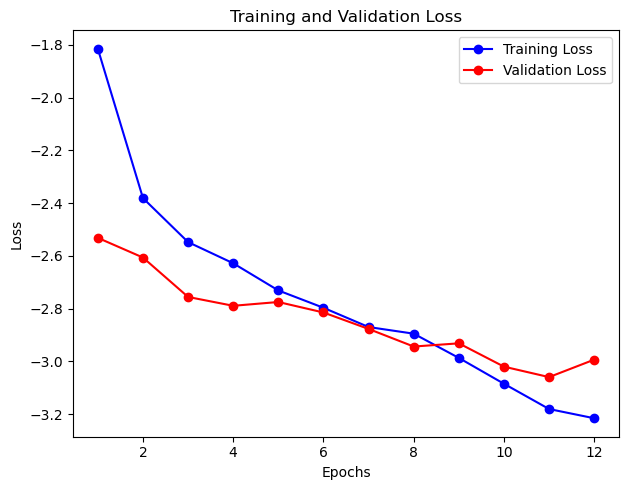

In [61]:
plot_learning_curve(history_ueyes)

# Train Model with Our Loss Term

In [ ]:
UMSI_ours = UMSI(input_shape=(224, 224, 3))
UMSI_ours.compile(optimizer=opt, loss = combined_loss, metrics=combined_metrics)
history_ours = UMSI_ours.fit(train_data_gen, validation_data=valid_data_gen, epochs=12, steps_per_epoch=len(train_data_gen), callbacks=[early_stopping, reduce_lr])

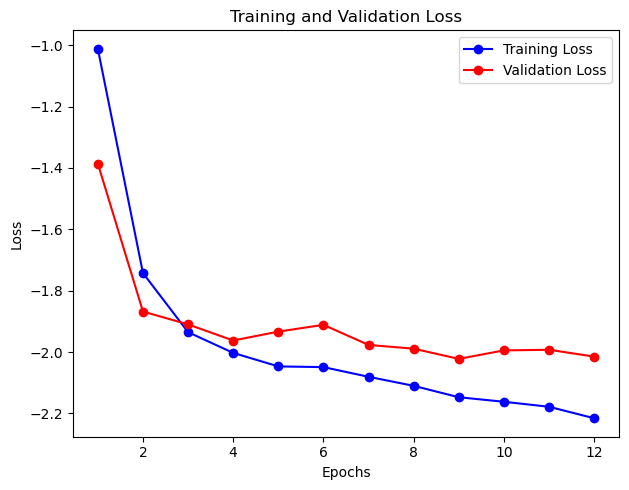

In [60]:
plot_learning_curve(history_ours)

# Visualize how these models do on training data

2025-03-12 20:39:57.447029: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


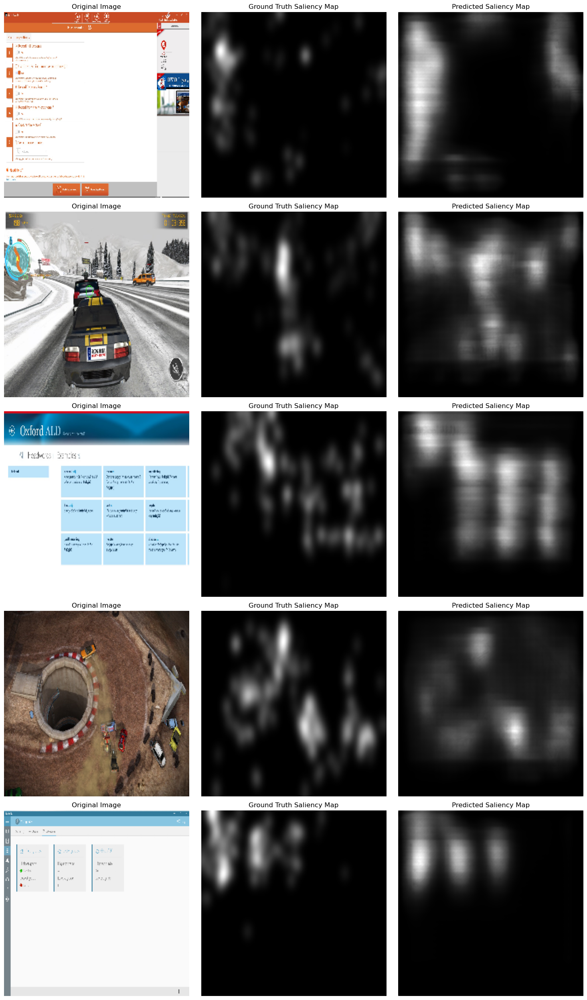

In [62]:
visualize_results(UMSI_ueyes, train_data_gen, num_samples=5)

2025-03-12 20:40:02.474499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


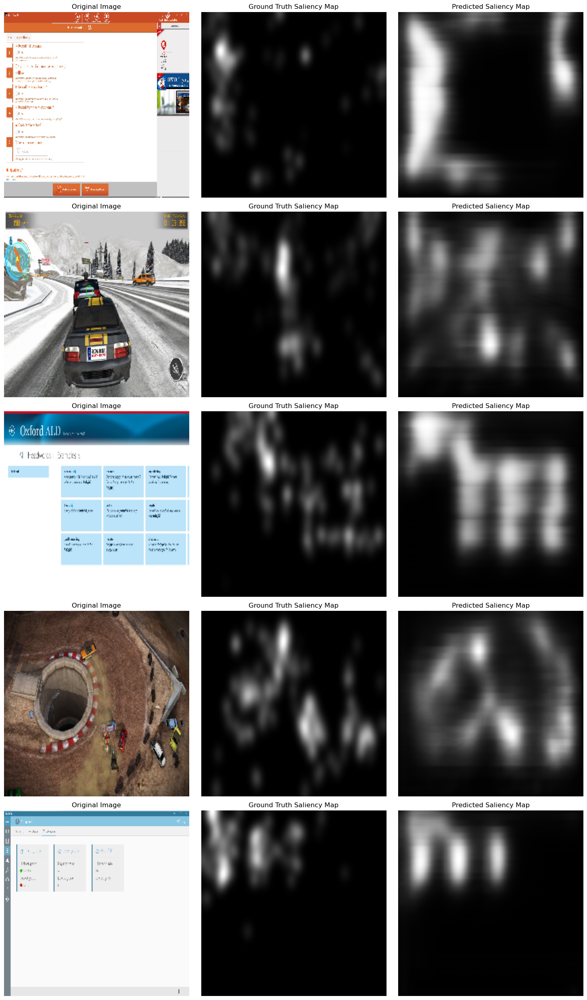

In [63]:
visualize_results(UMSI_ours, train_data_gen, num_samples=5)

# Compare their learning curves across all metrics

In [128]:
#plot_all_learning_curves(UMSI_ueyes)

In [ ]:
#plot_all_learning_curves(UMSI_ours)

# Evalute the models' performance on test data

### Compare their performance across all metrics

In [87]:
results_desktop_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_desktop)
results_desktop_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.866737842559814,0.692360758781433,0.763746500015259,1.128468275070190,0.491624325513840,0.525104761123657,0.959713816642761,0.598334133625031,0.000013769225006
Test,-2.866737842559814,0.692072212696075,0.763568758964539,1.128468275070190,0.491624325513840,0.525104761123657,0.959713816642761,0.598334133625031,0.000013769225006


In [88]:
results_desktop_ours = train_test_performance(UMSI_ours, test_data_gen_desktop)
results_desktop_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.004173517227173,0.692534148693085,0.763849020004272,1.127212047576904,0.194349125027657,0.427912175655365,0.876941561698914,0.589382529258728,0.000019486296878
Test,-2.004173517227173,0.692245006561279,0.763671278953552,1.127212047576904,0.194349125027657,0.427912175655365,0.876941561698914,0.589382529258728,0.000019486296878


In [146]:
# percent improvement from theirs to ours
percent_improvement = ((results_desktop_ours-results_desktop_UEyes)/results_desktop_UEyes)*100
percent_improvement['kl_divergence'] *= -1 # invert the KLD scale
percent_improvement

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-30.088706142813066,0.025043289853223,0.013423300664766,-0.111321471860429,-60.467959996787137,-18.509180008254447,-8.624680973480073,-1.496087865164711,-41.520651084258624
Test,-30.088706142813066,0.024967606274887,0.013426425297009,-0.111321471860429,-60.467959996787137,-18.509180008254447,-8.624680973480073,-1.496087865164711,-41.520651084258624


### Visualize their performance on test data

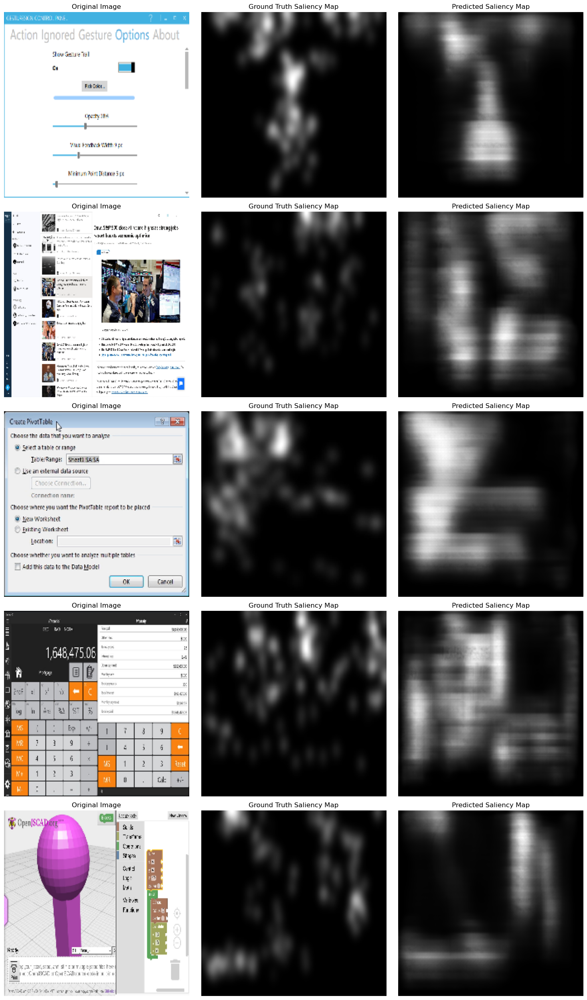

In [89]:
visualize_results(UMSI_ueyes, test_data_gen_desktop, num_samples=5)

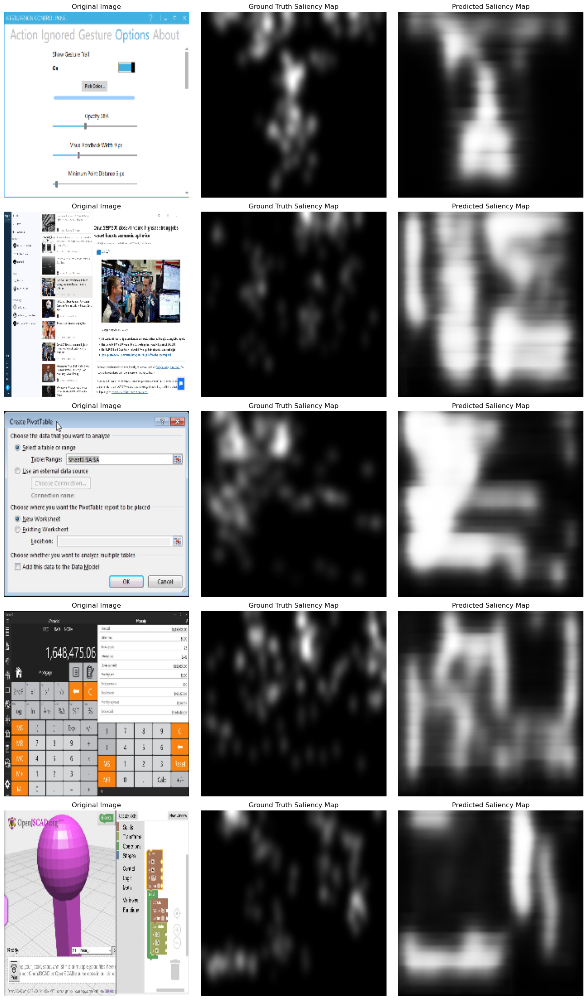

In [90]:
visualize_results(UMSI_ours, test_data_gen_desktop, num_samples=5)

# Evaluate the models' generalizability

### On 3 other categories

Poster category.

In [91]:
results_poster_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_poster)
results_poster_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.866737842559814,0.692072212696075,0.763568758964539,1.128468275070190,0.491624325513840,0.525104761123657,0.959713816642761,0.598334133625031,0.000013769225006
Test,-2.750531673431396,0.691574871540070,0.763344407081604,0.969737648963928,0.434913039207458,0.543750345706940,0.940968632698059,0.583322286605835,0.000011877831639


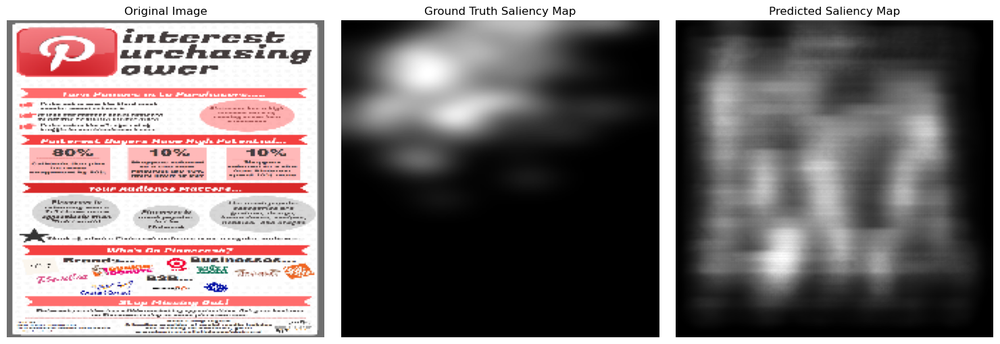

In [129]:
visualize_results(UMSI_ueyes, test_data_gen_poster, num_samples=1)

In [92]:
results_poster_ours = train_test_performance(UMSI_ours, test_data_gen_poster)
results_poster_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.004173517227173,0.692245006561279,0.763671278953552,1.127212047576904,0.194349125027657,0.427912175655365,0.876941561698914,0.589382529258728,0.000019486296878
Test,-1.785395264625549,0.691727399826050,0.763400137424469,0.929248273372650,0.143966287374496,0.458939850330353,0.872448682785034,0.551272392272949,0.000017487878722


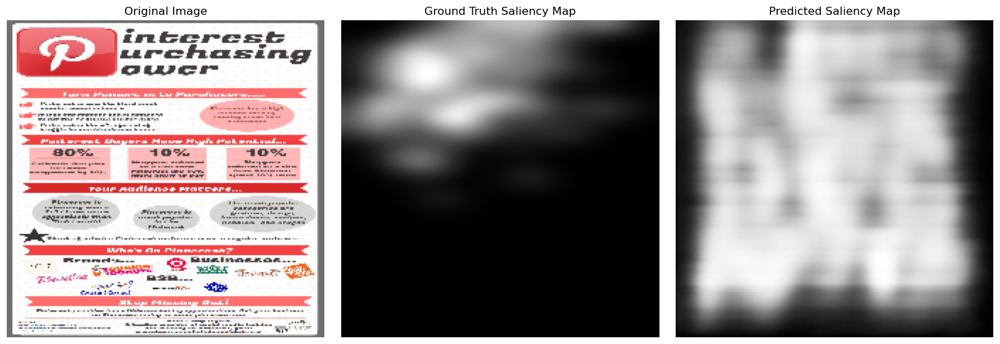

In [130]:
visualize_results(UMSI_ours, test_data_gen_poster, num_samples=1)

Mobile category.

In [93]:
results_mobile_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_mobile)
results_mobile_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.750531673431396,0.691574871540070,0.763344407081604,0.969737648963928,0.434913039207458,0.543750345706940,0.940968632698059,0.583322286605835,0.000011877831639
Test,-3.357201099395752,0.690946877002716,0.763079106807709,1.284704804420471,0.611140310764313,0.624274611473083,0.956370353698730,0.702997803688049,0.000008863348739


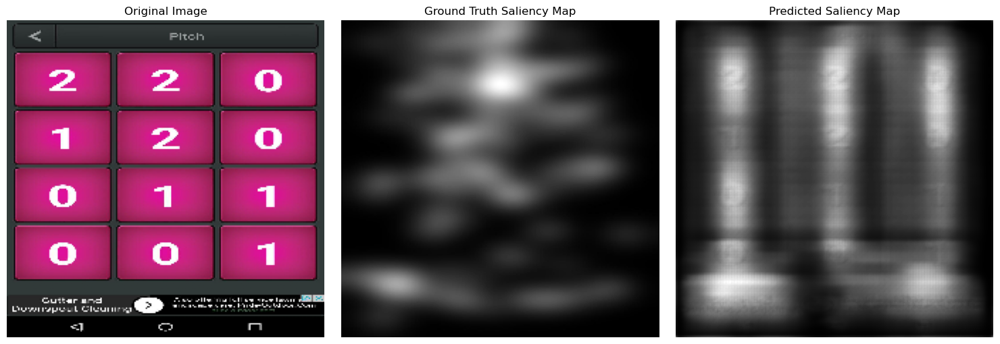

In [131]:
visualize_results(UMSI_ueyes, test_data_gen_mobile, num_samples=1)

In [94]:
results_mobile_ours = train_test_performance(UMSI_ours, test_data_gen_mobile)
results_mobile_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-1.785395264625549,0.691727399826050,0.763400137424469,0.929248273372650,0.143966287374496,0.458939850330353,0.872448682785034,0.551272392272949,0.000017487878722
Test,-2.193705558776855,0.691225647926331,0.763453125953674,1.222475171089172,0.222450733184814,0.491681694984436,0.879764080047607,0.654965579509735,0.000016401409084


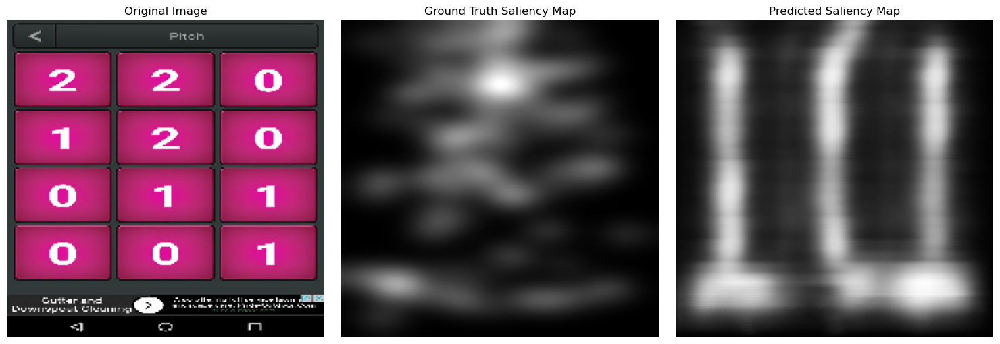

In [132]:
visualize_results(UMSI_ours, test_data_gen_mobile, num_samples=1)

Web category.

In [95]:
results_web_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_web)
results_web_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-3.357201099395752,0.690946877002716,0.763079106807709,1.284704804420471,0.611140310764313,0.624274611473083,0.956370353698730,0.702997803688049,0.000008863348739
Test,-2.441600799560547,0.690766751766205,0.763179302215576,0.904975771903992,0.429767876863480,0.524524807929993,0.946891665458679,0.495738506317139,0.000014149622075


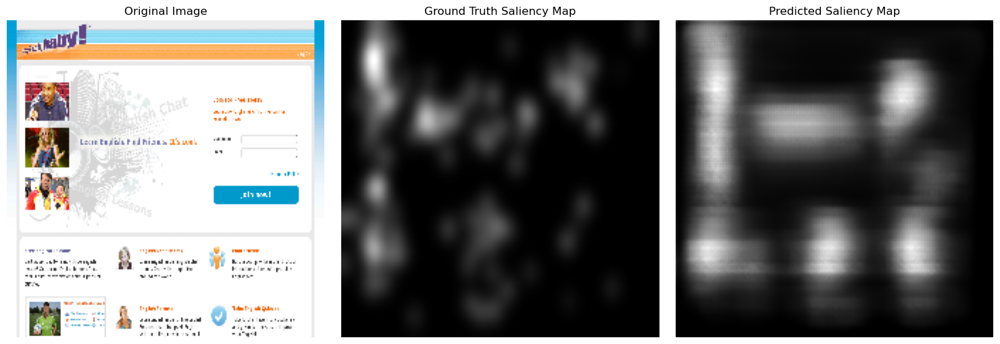

In [133]:
visualize_results(UMSI_ueyes, test_data_gen_web, num_samples=1)

In [96]:
results_web_ours = train_test_performance(UMSI_ours, test_data_gen_web)
results_web_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.193705558776855,0.691225647926331,0.763453125953674,1.222475171089172,0.222450733184814,0.491681694984436,0.879764080047607,0.654965579509735,0.000016401409084
Test,-1.667985916137695,0.690940737724304,0.763191223144531,0.894845843315125,0.183258771896362,0.437085449695587,0.834345579147339,0.485215514898300,0.000018900303985


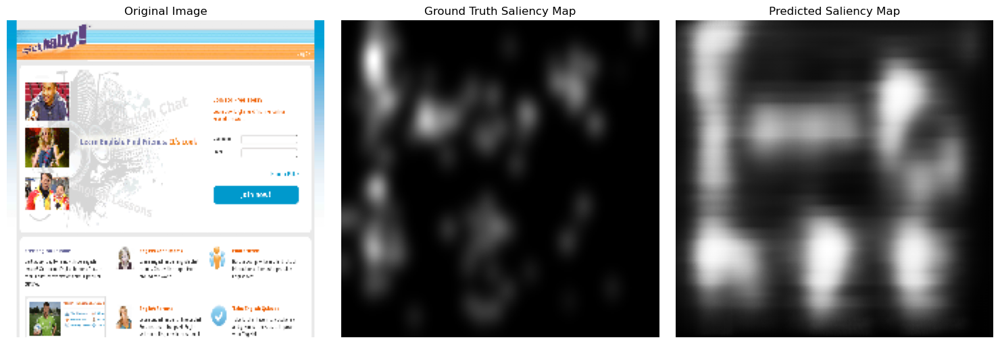

In [134]:
visualize_results(UMSI_ours, test_data_gen_web, num_samples=1)

### Input images rotated by 90 degrees

In [97]:
results_rotate_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_rotated_90)
results_rotate_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.441600799560547,0.690766751766205,0.763179302215576,0.904975771903992,0.429767876863480,0.524524807929993,0.946891665458679,0.495738506317139,0.000014149622075
Test,-1.428808927536011,0.690410971641541,0.762879252433777,0.501149177551270,-0.029988605529070,0.404893904924393,0.952376484870911,0.264594584703445,0.000024318072974


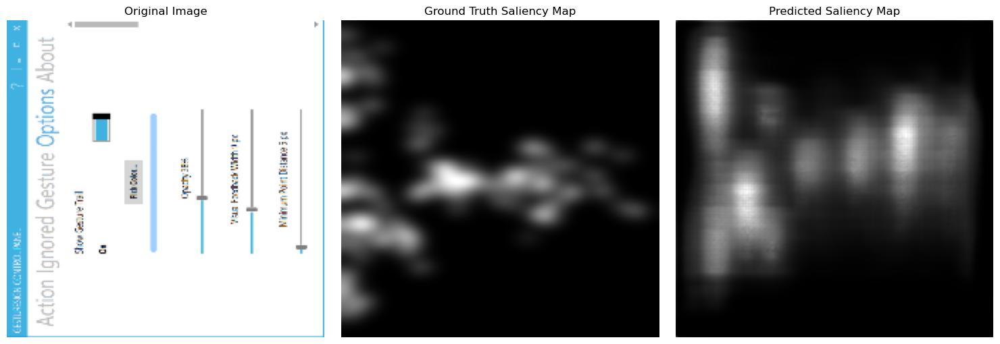

In [140]:
visualize_results(UMSI_ueyes, test_data_gen_rotated_90, num_samples=1)

In [98]:
results_rotate_ours = train_test_performance(UMSI_ours, test_data_gen_rotated_90)
results_rotate_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-1.667985916137695,0.690940737724304,0.763191223144531,0.894845843315125,0.183258771896362,0.437085449695587,0.834345579147339,0.485215514898300,0.000018900303985
Test,-1.148607611656189,0.690441489219666,0.762827515602112,0.591218590736389,0.061998061835766,0.392330199480057,0.929832696914673,0.304278969764709,0.000022130992875


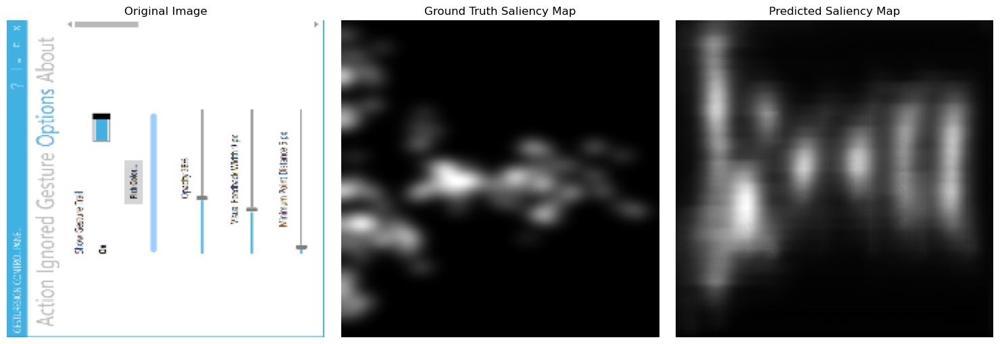

In [139]:
visualize_results(UMSI_ours, test_data_gen_rotated_90, num_samples=1)

### Input images flipped horizontally.

In [99]:
results_flip_h_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_flip_horizontal)
results_flip_h_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-1.428808927536011,0.690410971641541,0.762879252433777,0.501149177551270,-0.029988605529070,0.404893904924393,0.952376484870911,0.264594584703445,0.000024318072974
Test,-2.621481895446777,0.689978778362274,0.762544274330139,1.028606891632080,0.437742531299591,0.499134659767151,0.958717286586761,0.542317628860474,0.000014852178538


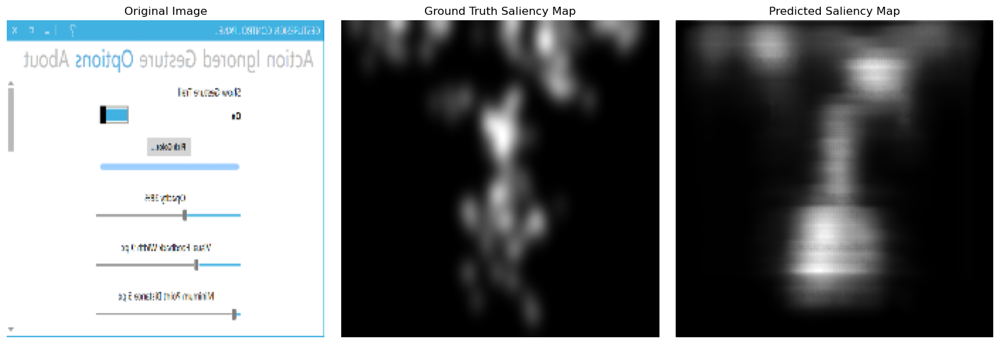

In [138]:
visualize_results(UMSI_ueyes, test_data_gen_flip_horizontal, num_samples=1)

In [100]:
results_flip_h_ours = train_test_performance(UMSI_ours, test_data_gen_flip_horizontal)
results_flip_h_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-1.148607611656189,0.690441489219666,0.762827515602112,0.591218590736389,0.061998061835766,0.392330199480057,0.929832696914673,0.304278969764709,0.000022130992875
Test,-1.878374576568604,0.690125584602356,0.762607395648956,1.048835277557373,0.176626846194267,0.422547429800034,0.878379225730896,0.547158360481262,0.000019840526875


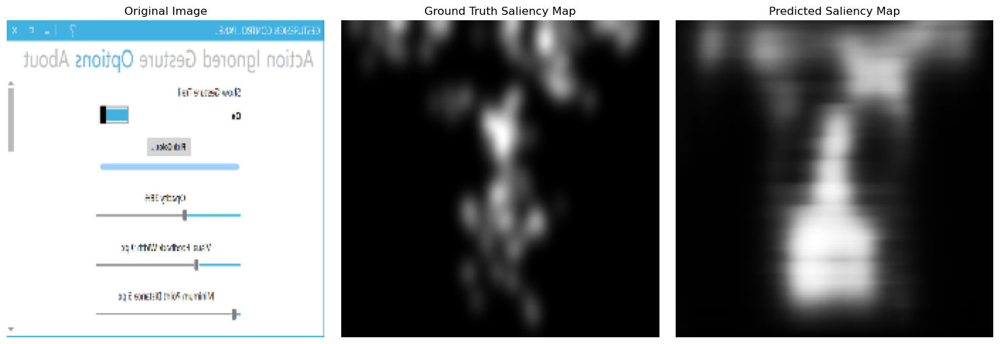

In [137]:
visualize_results(UMSI_ours, test_data_gen_flip_horizontal, num_samples=1)

### Input images flipped vertically.

In [101]:
results_flip_v_UEyes = train_test_performance(UMSI_ueyes, test_data_gen_flip_vertical)
results_flip_v_UEyes

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-2.621481895446777,0.689978778362274,0.762544274330139,1.028606891632080,0.437742531299591,0.499134659767151,0.958717286586761,0.542317628860474,0.000014852178538
Test,-1.674307942390442,0.689649999141693,0.762321710586548,0.623436808586121,-0.054750051349401,0.412356972694397,0.950534820556641,0.325220614671707,0.000024994473279


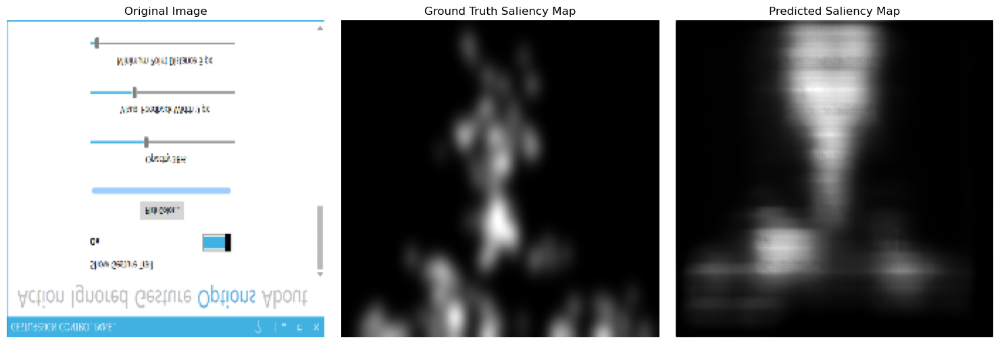

In [136]:
visualize_results(UMSI_ueyes, test_data_gen_flip_vertical, num_samples=1)

In [102]:
results_flip_v_ours = train_test_performance(UMSI_ours, test_data_gen_flip_vertical)
results_flip_v_ours

,loss,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
Train,-1.878374576568604,0.690125584602356,0.762607395648956,1.048835277557373,0.176626846194267,0.422547429800034,0.878379225730896,0.547158360481262,0.000019840526875
Test,-1.312613248825073,0.689681947231293,0.762211859226227,0.686258137226105,0.108043074607849,0.405876010656357,0.866108536720276,0.361362516880035,0.000021212654246


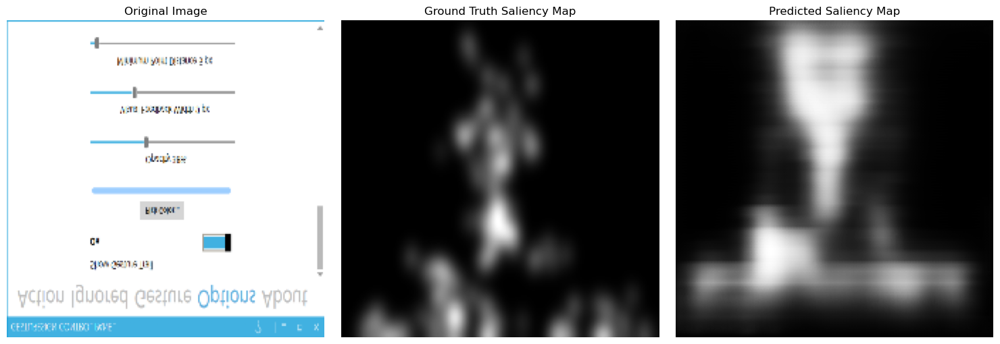

In [135]:
visualize_results(UMSI_ours, test_data_gen_flip_vertical, num_samples=1)

## compare generalization performance to baseline performance

In [155]:
# Define the generalization conditions
generalization_conditions = ['poster', 'mobile', 'web', 'rotate', 'flip_h', 'flip_v']

# Define the metrics to compare (excluding 'loss')
metrics = ['nss', 'cc', 'sim', 'sim_opposite', 'cosine_similarity', 'ig', 'auc_judd', 'auc_pr']

# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_vals = pd.DataFrame()
desktop_df = globals()['results_desktop_ours']

# Iterate over each generalization condition
for condition in generalization_conditions:
    generalize_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = desktop_df.columns

    # Extract the Test row for the available metrics
    desktop_test = desktop_df.loc['Test', available_metrics]
    generalize_test = generalize_df.loc['Test', available_metrics]

    # Calculate the change
    improvement = generalize_test - desktop_test

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_vals = pd.concat([generalizability_improvement_vals, pd.DataFrame(improvement).T])

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_vals.index = generalization_conditions

# remove the loss column
generalizability_improvement_vals = generalizability_improvement_vals.drop('loss', axis=1)

# Display the consolidated DataFrame
print("Change in Performance Metrics in Our Model Across Generalization Conditions:")
display(generalizability_improvement_vals)

Change in Performance Metrics in Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
poster,-0.000517606735229,-0.000271141529083,-0.197963774204254,-0.050382837653160,0.031027674674988,-0.004492878913879,-0.038110136985779,-0.000001998418156
mobile,-0.001019358634949,-0.000218152999878,0.095263123512268,0.028101608157158,0.063769519329071,0.002822518348694,0.065583050251007,-0.000003084887794
web,-0.001304268836975,-0.000480055809021,-0.232366204261780,-0.011090353131294,0.009173274040222,-0.042595982551575,-0.104167014360428,-0.000000585992893
rotate,-0.001803517341614,-0.000843763351440,-0.535993456840515,-0.132351063191891,-0.035581976175308,0.052891135215759,-0.285103559494019,0.000002644695996
flip_h,-0.002119421958923,-0.001063883304596,-0.078376770019531,-0.017722278833389,-0.005364745855331,0.001437664031982,-0.042224168777466,0.000000354229996
flip_v,-0.002563059329987,-0.001459419727325,-0.440953910350800,-0.086306050419807,-0.022036164999008,-0.010833024978638,-0.228020012378693,0.000001726357368


In [ ]:
# Define the generalization conditions
generalization_conditions = ['poster', 'mobile', 'web', 'rotate', 'flip_h', 'flip_v']

# Define the metrics to compare (excluding 'loss')
metrics = ['nss', 'cc', 'sim', 'sim_opposite', 'cosine_similarity', 'ig', 'auc_judd', 'auc_pr']

# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_percentages = pd.DataFrame()
desktop_df = globals()['results_desktop_ours']

# Iterate over each generalization condition
for condition in generalization_conditions:
    generalize_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = desktop_df.columns

    # Extract the Test row for the available metrics
    desktop_test = desktop_df.loc['Test', available_metrics]
    generalize_test = generalize_df.loc['Test', available_metrics]

    # Calculate the change
    improvement = ((generalize_test - desktop_test)/desktop_test)*100

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_percentages = pd.concat([generalizability_improvement_percentages, pd.DataFrame(improvement).T])

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_percentages.index = generalization_conditions

# remove the loss column
generalizability_improvement_percentages = generalizability_improvement_percentages.drop('loss', axis=1)

# negate the KLD scale (bc lower is better)
generalizability_improvement_percentages['kl_divergence'] *=-1

# Display the consolidated DataFrame
print("Percent Improvement in Performance Metrics in Our Model Across Generalization Conditions:")
display(generalizability_improvement_percentages)

Percent Improvement in Performance Metrics in Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
poster,-0.074772187639272,-0.035505005433070,-17.562247904447457,-25.923881903759767,7.250944572322028,-0.512335041479305,-6.466112430192034,10.255505028841922
mobile,-0.147254024989272,-0.028566348622782,8.451215875224996,14.459343798516686,14.902478348835347,0.321859342967590,11.127416744688972,15.831062276054460
web,-0.188411447480718,-0.062861576996690,-20.614240662285553,-5.706407543494757,2.143728213896444,-4.857334218377425,-17.673922993855911,3.007204996310456
rotate,-0.260531650574516,-0.110487768061230,-47.550366232574078,-68.099644479004823,-8.315252100694021,6.031318108961833,-48.373262752222395,-13.572081001017017
flip_h,-0.306166449571308,-0.139311682122414,-6.953152265184956,-9.118784985971685,-1.253702549387639,0.163940688270859,-7.164136478658700,-1.817841525553070
flip_v,-0.370253205973785,-0.191105750281098,-39.118984870565392,-44.407738088620562,-5.149693383989107,-1.235318914255893,-38.687949007493579,-8.859340381350929


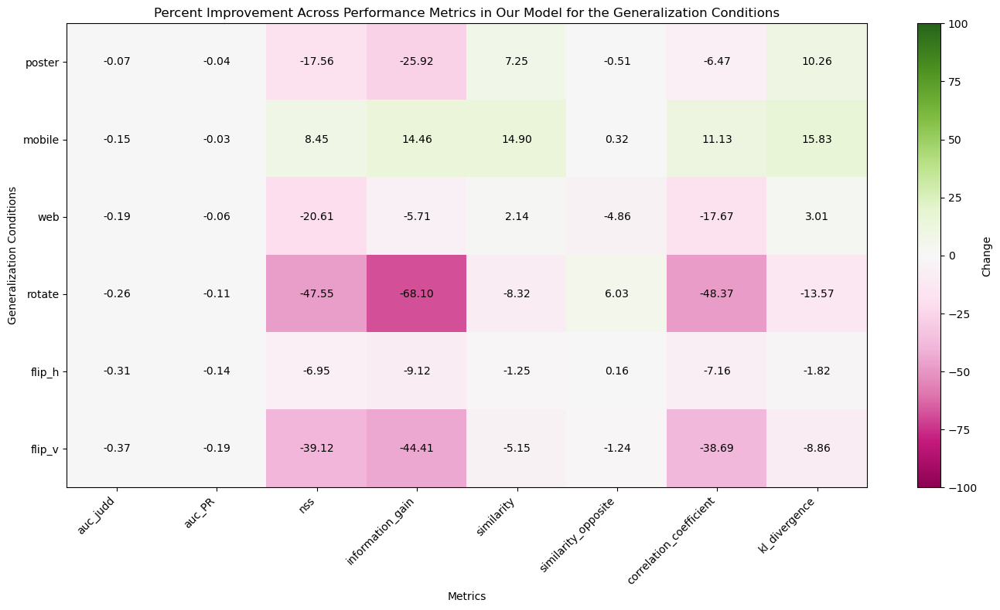

In [161]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(14,8))

# Create the heatmap using imshow
cax = ax.imshow(generalizability_improvement_percentages, cmap='PiYG', aspect='auto', vmin=-100, vmax=100)

# Add colorbar
cbar = fig.colorbar(cax)
cbar.set_label('Change')

# Set ticks and labels
ax.set_xticks(np.arange(len(generalizability_improvement_percentages.columns)))
ax.set_yticks(np.arange(len(generalizability_improvement_percentages.index)))
ax.set_xticklabels(generalizability_improvement_percentages.columns, rotation=45, ha='right')
ax.set_yticklabels(generalizability_improvement_percentages.index)

# Add annotations (values in each cell)
for i in range(len(generalizability_improvement_percentages.index)):
    for j in range(len(generalizability_improvement_percentages.columns)):
        ax.text(j, i, f"{generalizability_improvement_percentages.iloc[i, j]:.2f}", ha='center', va='center', color='black')

# Add title and labels
ax.set_title("Percent Improvement Across Performance Metrics in Our Model for the Generalization Conditions")
ax.set_xlabel("Metrics")
ax.set_ylabel("Generalization Conditions")

# Display the heatmap
plt.tight_layout()
plt.show()

### compare generalization performance between UEyes' and our model

In [142]:
# Define the generalization conditions
generalization_conditions = ['poster', 'mobile', 'web', 'rotate', 'flip_h', 'flip_v']

# Define the metrics to compare (excluding 'loss')
metrics = ['nss', 'cc', 'sim', 'sim_opposite', 'cosine_similarity', 'ig', 'auc_judd', 'auc_pr']

# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_vals = pd.DataFrame()

# Iterate over each generalization condition
for condition in generalization_conditions:
    # Extract the Test row for UEyes and ours models
    ueyes_df = globals()[f'results_{condition}_UEyes']
    ours_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = ueyes_df.columns

    # Extract the Test row for the available metrics
    ueyes_test = ueyes_df.loc['Test', available_metrics]
    ours_test = ours_df.loc['Test', available_metrics]

    # Calculate the improvement
    improvement = ours_test - ueyes_test

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_vals = pd.concat([generalizability_improvement_vals, pd.DataFrame(improvement).T])

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_vals.index = generalization_conditions

# remove the loss column
generalizability_improvement_vals = generalizability_improvement_vals.drop('loss', axis=1)

# Display the consolidated DataFrame
print("Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:")
display(generalizability_improvement_vals)

Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
poster,0.000152528285980,0.000055730342865,-0.040489375591278,-0.290946751832962,-0.084810495376587,-0.068519949913025,-0.032049894332886,0.000005610047083
mobile,0.000278770923615,0.000374019145966,-0.062229633331299,-0.388689577579498,-0.132592916488647,-0.076606273651123,-0.048032224178314,0.000007538060345
web,0.000173985958099,0.000011920928955,-0.010129928588867,-0.246509104967117,-0.087439358234406,-0.112546086311340,-0.010522991418839,0.000004750681910
rotate,0.000030517578125,-0.000051736831665,0.090069413185120,0.091986667364836,-0.012563705444336,-0.022543787956238,0.039684385061264,-0.000002187080099
flip_h,0.000146806240082,0.000063121318817,0.020228385925293,-0.261115685105324,-0.076587229967117,-0.080338060855865,0.004840731620789,0.000004988348337
flip_v,0.000031948089600,-0.000109851360321,0.062821328639984,0.162793125957251,-0.006480962038040,-0.084426283836365,0.036141902208328,-0.000003781819032


In [143]:
# Initialize an empty DataFrame to store all improvement results
generalizability_improvement_percentages = pd.DataFrame()

# Iterate over each generalization condition
for condition in generalization_conditions:
    # Extract the Test row for UEyes and ours models
    ueyes_df = globals()[f'results_{condition}_UEyes']
    ours_df = globals()[f'results_{condition}_ours']

    # Filter metrics to include in the DataFrame
    available_metrics = ueyes_df.columns

    # Extract the Test row for the available metrics
    ueyes_test = ueyes_df.loc['Test', available_metrics]
    ours_test = ours_df.loc['Test', available_metrics]

    # Calculate the percent improvement
    improvement = ((ours_test - ueyes_test)/ueyes_test)*100

    # Add the improvement results to the consolidated DataFrame
    generalizability_improvement_percentages = pd.concat([generalizability_improvement_percentages, pd.DataFrame(improvement).T])

# Set the index of the consolidated DataFrame to the generalization conditions
generalizability_improvement_percentages.index = generalization_conditions

# remove the loss column
generalizability_improvement_percentages = generalizability_improvement_percentages.drop('loss', axis=1)

# Display the consolidated DataFrame
print("Percent Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:")
display(generalizability_improvement_percentages)

Percent Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions:


,auc_judd,auc_PR,nss,information_gain,similarity,similarity_opposite,correlation_coefficient,kl_divergence
poster,0.022055209386159,0.007300812365687,-4.175291702300833,-66.897684273424858,-15.597322566539843,-7.281852713469972,-5.494371648197052,47.231239281049483
mobile,0.040346216604060,0.049014465555250,-4.843885779610713,-63.600710136988013,-21.239517682093723,-8.010105431943895,-6.832485667284985,85.047543162870937
web,0.025187367176330,0.001562008943438,-1.119359092625727,-57.358662254187877,-16.670204518920652,-11.885846123360103,-2.122689943336100,33.574620473471803
rotate,0.004420204686557,-0.006781785125233,17.972575276930424,-306.738728733708854,-3.102962354220176,-2.367108839241603,14.998184904555714,-8.993640662182562
flip_h,0.021276921071434,0.008277725102924,1.966580827899840,-59.650517469735234,-15.344001557184123,-8.379744683845866,0.892600823425194,33.586644036123872
flip_v,0.004632507741517,-0.014410105182040,10.076615267945972,-297.338763973652874,-1.571687267876827,-8.881976968179247,11.113041602486229,-15.130621037683460


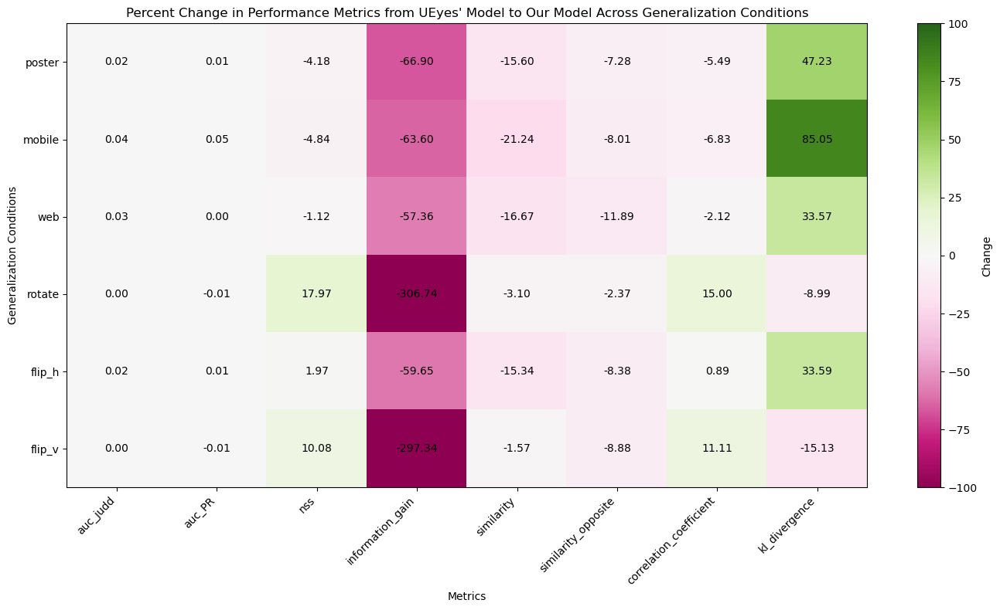

In [150]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(14,8))

# Create the heatmap using imshow
cax = ax.imshow(generalizability_improvement_percentages, cmap='PiYG', aspect='auto', vmin=-100, vmax=100)

# Add colorbar
cbar = fig.colorbar(cax)
cbar.set_label('Change')

# Set ticks and labels
ax.set_xticks(np.arange(len(generalizability_improvement_percentages.columns)))
ax.set_yticks(np.arange(len(generalizability_improvement_percentages.index)))
ax.set_xticklabels(generalizability_improvement_percentages.columns, rotation=45, ha='right')
ax.set_yticklabels(generalizability_improvement_percentages.index)

# Add annotations (values in each cell)
for i in range(len(generalizability_improvement_percentages.index)):
    for j in range(len(generalizability_improvement_percentages.columns)):
        ax.text(j, i, f"{generalizability_improvement_percentages.iloc[i, j]:.2f}", ha='center', va='center', color='black')

# Add title and labels
ax.set_title("Percent Change in Performance Metrics from UEyes' Model to Our Model Across Generalization Conditions")
ax.set_xlabel("Metrics")
ax.set_ylabel("Generalization Conditions")

# Display the heatmap
plt.tight_layout()
plt.show()